# **Deep Learning Homework 6: *Variational Autoencoders***
## **Can Abdullah Camuz**
### MSc Computer Science, Data Science, Cybersecurity Computer Engeneering @UniPD
### 2nd semester - 6 ECTS
### Prof. Nicolò Navarin & Prof. Alessandro Sperduti
---

In this homework, we will explore how to develop a Variational Autoencoder (VAE). As a dataset, we will use the MNIST dataset. In developing the VAE we also explore how to develop an ad-hoc layer and a custom training step.

**NOTE**: in order to run this notebook without problems, please connect to a *GPU runtime*. You can do so by clicking on the RAM / Disk icon in the upper right part of the notebook, then on *Change runtime tipe* at the bottom of the page, and then select the GPU hardware accelerator.


### Load Dataset
We load the MNIST dataset, using `tf.keras.datasets`. The dataset contains 60,000 training grayscale images and 10,000 testing image of handwritten digits.

In [27]:
# load necessary libriaries and functions
import numpy as np
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt

def plot_loss(history):
  plt.figure(figsize=(10,6))
  plt.subplot(1, 2, 1)
  plt.plot(history.epoch,history.history['reconstruction_loss'])
  plt.title('reconstruction_loss')
  plt.subplot(1, 2, 2)
  plt.plot(history.epoch,history.history['kl_loss'])
  plt.title('kl_loss')
  plt.show()

In [28]:
(x_train_full, y_train), (x_test, y_test) = tf.keras.datasets.mnist.load_data()

# Rescale the pixel values
x_train_full = x_train_full.astype('float32') / 255
x_test = x_test.astype('float32') / 255

# Flatten the arrays
x_train = x_train_full.reshape((len(x_train_full), np.prod(x_train_full.shape[1:])))
x_test = x_test.reshape((len(x_test), np.prod(x_test.shape[1:])))

# In this HW, we will not need a validation set since we will not deal with model selection
# x_valid, y_valid = x_train[:10000], y_train[:10000]
# x_train, y_train = x_train[10000:], y_train[10000:]

##[TO COMPLETE] Exercise 6.1: Variational Autoencoder: reparameterization trick
To implement a VAE we have to define 2 main parts: the _Encoder_ and the _Decoder_.
Let's start by the Encoder, that computes an encoding of the input from which it computes the mean and the average of the sample distribution.
Once we have these two statistics, we have to implement the sampling phase. Keras does not provide any predefined method to perform this operation, therefore we have to define it. With the aim to be consistent with the layer-composition paradigm used by Keras in defining a model, we define a Sampling layer as a new layer.

To do this we define a new class that inherits from the layer base class `tf.keras.layers` that is used as base class for all the layers defined in Keras. In more detail, from this class we are interested in overriding the *call* method, that is the one that is called when a layer is exploited by the model, and where the operations executed by the layer are defined.

In our case, the Sampling layer has in input the tuple made of the mean and the log-variance, and it has to compute the sample $z$ from them by exploiting the reparameterization trick:
$$
z=z_{mean} + exp(z_{var}/2) * \epsilon
$$
The reparameterization trick is used in VAE because it actually helps in the backpropagation process. Specifically, $\epsilon \sim \mathcal{N}(0,1)$ actually reparameterizes our VAE network. This allows the mean and log-variance vectors to still remain as the learnable parameters of the network while  maintaining the stochasticity of the entire system via epsilon.

**[TO COMPLETE]**: complete the code defining the Sampling layer that implements the reparametrization trick.

**Hint**: to generate random values from a normal distribution you can use the keras [tf.keras.backend.random_normal](https://www.tensorflow.org/api_docs/python/tf/keras/backend/random_normal) method, and make sure the output shape is the proper one.


In [29]:
class Sampling(tf.keras.layers.Layer):
   
    def call(self, inputs):
        #[TO COMPLETE] compute and return z
        z_mean, z_var = inputs
        # ...
        epsilon = tf.keras.backend.random_normal(tf.shape(z_mean))
        z = z_mean + tf.math.exp(z_var/2)*epsilon
        return z

##[TO COMPLETE] Exercise 6.2: Encoder
Now we can define the Encoder. Let's use $n$ dense layers (similarly to what we did in HW5, with a funnel-like architecture), and then use the obtained encoding to compute `z_mean` and `z_var`, by using two different dense layers. Finally, we use the Sampling layer to compute the sample $z$. Note that we define the `latent_dim` (that is the dimension of $z$) to $2$. This choice is made to make possible to represent the results graphically.

**[TO COMPLETE]**: complete the code defining a deep encoder and the Dense layers that model `z_mean` and `z_var`. Explain your choice for what concerns the number of layers, the layers sizes and the activation functions. Insert motivations about your choice into the text cell below.

In [30]:
latent_dim = 2
INPUT_DIM = x_train.shape[-1]

encoder_inputs = tf.keras.layers.Input(shape=(INPUT_DIM,))
x = tf.keras.layers.Dense(256, activation="relu")(encoder_inputs) #[TO COMPLETE]
x = tf.keras.layers.Dense(128, activation="relu")(x) #[TO COMPLETE with more layers]...
x = tf.keras.layers.Dense(64, activation="relu")(x)

z_mean = tf.keras.layers.Dense(latent_dim)(x)#[TO COMPLETE] Hint: size would be = latent_dim
z_var = tf.keras.layers.Dense(latent_dim)(x)#[TO COMPLETE] Hint: size would be = latent_dim

z = Sampling()([z_mean, z_var])
encoder = tf.keras.Model(encoder_inputs, [z_mean, z_var, z], name="encoder")
encoder.summary()

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_18 (InputLayer)          [(None, 784)]        0           []                               
                                                                                                  
 dense_79 (Dense)               (None, 256)          200960      ['input_18[0][0]']               
                                                                                                  
 dense_80 (Dense)               (None, 128)          32896       ['dense_79[0][0]']               
                                                                                                  
 dense_81 (Dense)               (None, 64)           8256        ['dense_80[0][0]']               
                                                                                            

**Answer:** I observed the changes in the model while changing the number of layers, the layer sizes and the activation functions.

**For the number of layers**, 3 layers seemed the best for having a powerful encoder, which both ignores the insignificant data and keeps the meaningful data. In order to have an efficient encoder, this two should be considered.

**Layer sizes** were determined to have a funnel like shape for the dimensionality reduction (main purpose) of the encoder. Starting from 256 and decreasing yielded better results than the other numbers of nodes.

**Choice of the activation function** depends on input and output data type and shape. Since we are using pixel based data, non-linear functions perform better in encoders, as we dicovered in the previous homework (HW5). Among relu, sigmoid, linear and tanh activation functions, relu, which is a piecewise linear function, had better results, for overcoming the vanishing gradient problem. It reduces the effects of this problem. Since relu does not have an upper bound, this means that the output can be greater than 1.

##[TO COMPLETE] Exercise 6.3: Decoder
Then we have to define the decoder part. It takes in input $z$ that "decodes" as an image in the input space. The architecture of the decoder should be specular to the encoder architecture, i.e. $n$ layers of the same dimensions of ones in the encoder, but occurring in the reverse order.

**[TO COMPLETE]**: Define the decoder. Explain in this cell your choice for what concerns the number of layers, the layers sizes, and the activation functions (in particular, for what concerns the last layer). Answer in the text cell below.

In [31]:
latent_inputs = keras.Input(shape=(latent_dim,))

x = tf.keras.layers.Dense(64, activation='relu')(latent_inputs) #[TO COMPLETE]
x = tf.keras.layers.Dense(128, activation='relu')(x) #[TO COMPLETE]
x = tf.keras.layers.Dense(256, activation='relu')(x) #[TO COMPLETE]


decoder_outputs = tf.keras.layers.Dense(INPUT_DIM, activation="sigmoid")(x) #[TO COMPLETE]

decoder = tf.keras.Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()

Model: "decoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_19 (InputLayer)       [(None, 2)]               0         
                                                                 
 dense_84 (Dense)            (None, 64)                192       
                                                                 
 dense_85 (Dense)            (None, 128)               8320      
                                                                 
 dense_86 (Dense)            (None, 256)               33024     
                                                                 
 dense_87 (Dense)            (None, 784)               201488    
                                                                 
Total params: 243,024
Trainable params: 243,024
Non-trainable params: 0
_________________________________________________________________


**Answer:** After having implemented the encoder, we need to construct our decoder based on the encoder. Since I used 3 layers in the encoder (except for the input layer), I needed the use the same number of layers in the decoder to match with the encoder's operations. Of course, the layer amount may be different, but in that case the data will not be reconstructed as required. The aim here is to reconstruct the input, starting from the latent space created by the encoder. 

And for the layer units, the ones in the encoder were used in the reverse order,which is the requirement of the encoder-decoder structures to reconstruct the images. Once again a funnel like shape was employed.

Relu served well again, because of the reasons explained above. However, for the decoded layer, sigmoid activation function was used. This is because our input data was normalised in the beginning, meaning that the values of pixels are between [0,1]. For this reason, relu or tanh functions are not suitable for the last layer. On the other hand sigmoid function gives in output value in required interval, allowing the range to be matched.

##[TO COMPLETE] Exercise 6.4: Training
Now we can define the VAE, but since it is a generative model, we have to define an ad-hoc training phase. Specifically, we have to manage the two losses used for this model. Indeed the parameters of a VAE are trained via two loss functions: a reconstruction loss, that forces the decoded samples to match the initial inputs, and a regularization loss that helps to learn  a well-formed latent space, and to reduce overfitting. The regularization loss is handled with the Kullback-Liebler Divergence. While for the reconstruction loss we are supposed to use the negative log-likelihood. Keras, however, does not support it natively, so to make the exercise simple, we will use as a proxy the binary cross-entropy (`keras.losses.binary_crossentropy`) to compare each feature of a data point to the value in the reconstructed output.

Therefore, we have to define a class that inherits from [keras.model](https://www.tensorflow.org/api_docs/python/tf/keras/Model), and overrides the [training_step method](https://www.tensorflow.org/api_docs/python/tf/keras/Model#train_step), that allows to define a custom training logic.

**[TO COMPLETE]** implement the reconstruction loss and the KL-loss.

In [32]:
class VAE(keras.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder

    def train_step(self, data):
        if isinstance(data, tuple):
            data = data[0]
        with tf.GradientTape() as tape: # record operations for automatic differentiation
            z_mean, z_var, z = encoder(data)
            reconstruction = decoder(z)

            reconstruction_loss = keras.losses.binary_crossentropy(data, reconstruction) #[TO COMPLETE]
            reconstruction_loss *= INPUT_DIM
            reconstruction_loss = tf.reduce_mean(reconstruction_loss)

            
            kl_loss = -0.5 *  (1 + z_var - tf.square(z_mean) - tf.exp(z_var)) #[TO COMPLETE]
            kl_loss = tf.reduce_sum(kl_loss, axis=-1)
            kl_loss = tf.reduce_mean(kl_loss)


            total_loss = reconstruction_loss + kl_loss
        grads = tape.gradient(total_loss, self.trainable_weights) # optimize the custom loss
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        return {
            "loss": total_loss,
            "reconstruction_loss": reconstruction_loss,
            "kl_loss": kl_loss,
        }

Let's now train the VAE model using Adam as optimizer.

Epoch 1/30
469/469 [==============================] - 6s 8ms/step - loss: 199.3957 - reconstruction_loss: 195.8073 - kl_loss: 3.5884
Epoch 2/30
469/469 [==============================] - 4s 8ms/step - loss: 166.9075 - reconstruction_loss: 162.0473 - kl_loss: 4.8602
Epoch 3/30
469/469 [==============================] - 4s 8ms/step - loss: 159.5766 - reconstruction_loss: 154.2601 - kl_loss: 5.3165
Epoch 4/30
469/469 [==============================] - 4s 8ms/step - loss: 155.4061 - reconstruction_loss: 149.8035 - kl_loss: 5.6026
Epoch 5/30
469/469 [==============================] - 2s 5ms/step - loss: 152.6539 - reconstruction_loss: 146.8643 - kl_loss: 5.7896
Epoch 6/30
469/469 [==============================] - 2s 4ms/step - loss: 150.4027 - reconstruction_loss: 144.4403 - kl_loss: 5.9624
Epoch 7/30
469/469 [==============================] - 2s 5ms/step - loss: 148.5476 - reconstruction_loss: 142.4686 - kl_loss: 6.0789
Epoch 8/30
469/469 [==============================] - 2s 5ms/step - l

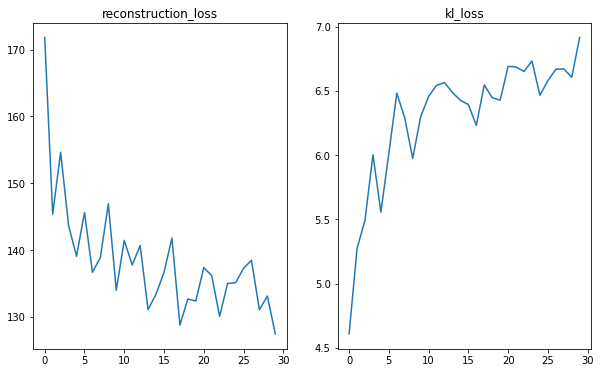

In [33]:
vae = VAE(encoder, decoder)
vae.compile(optimizer=keras.optimizers.Adam())
history = vae.fit(x_train, epochs=30, batch_size=128)
plot_loss(history)

##[TO COMPLETE] Exercise 6.5: Model Analysis
Now we can plot an example of the data generation by using the decoder part. Since we used a 2D latent space let's generate several possibile 2D $\hat{z}$ samples and pass them to our decoder. With the $scale$ parameter we can define the interval from where the entries of $\hat{z}$ are chosen, and with parameter $n$ it is possibile to define how many samples are generated.  

Scale value: 2.0


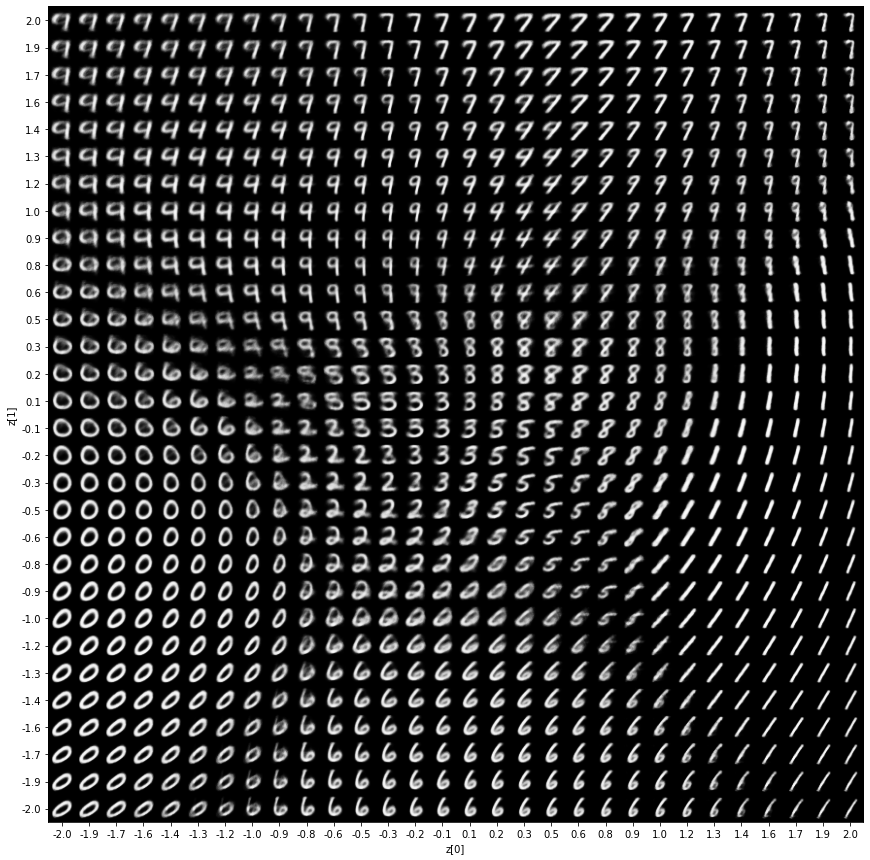

Scale value: 0.2


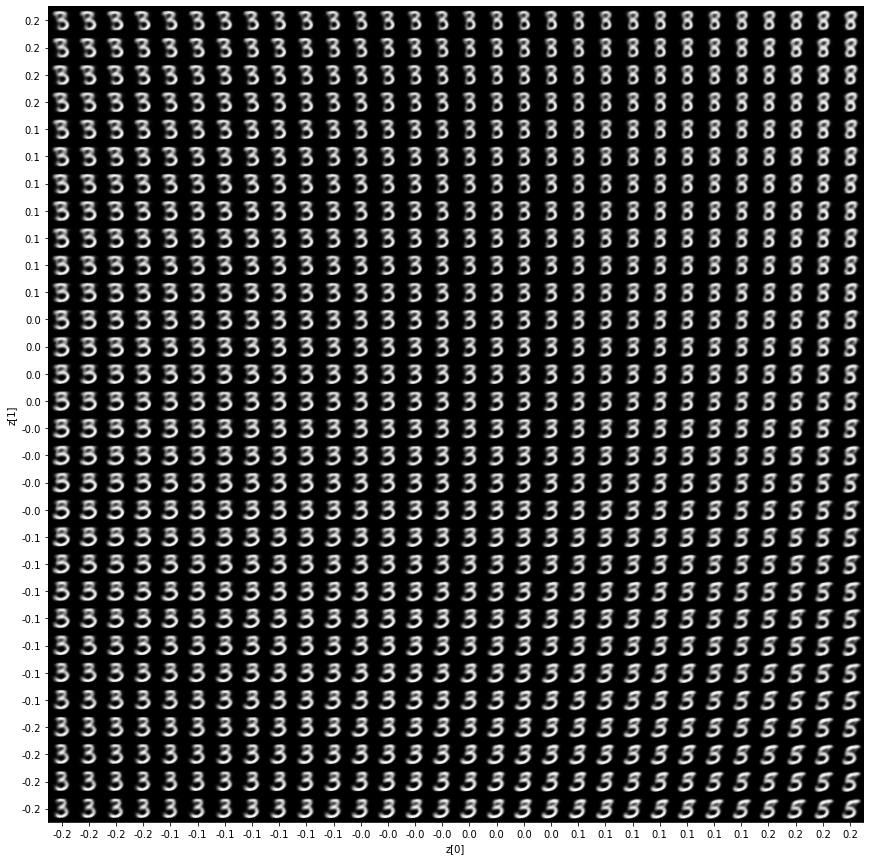

Scale value: 0.4


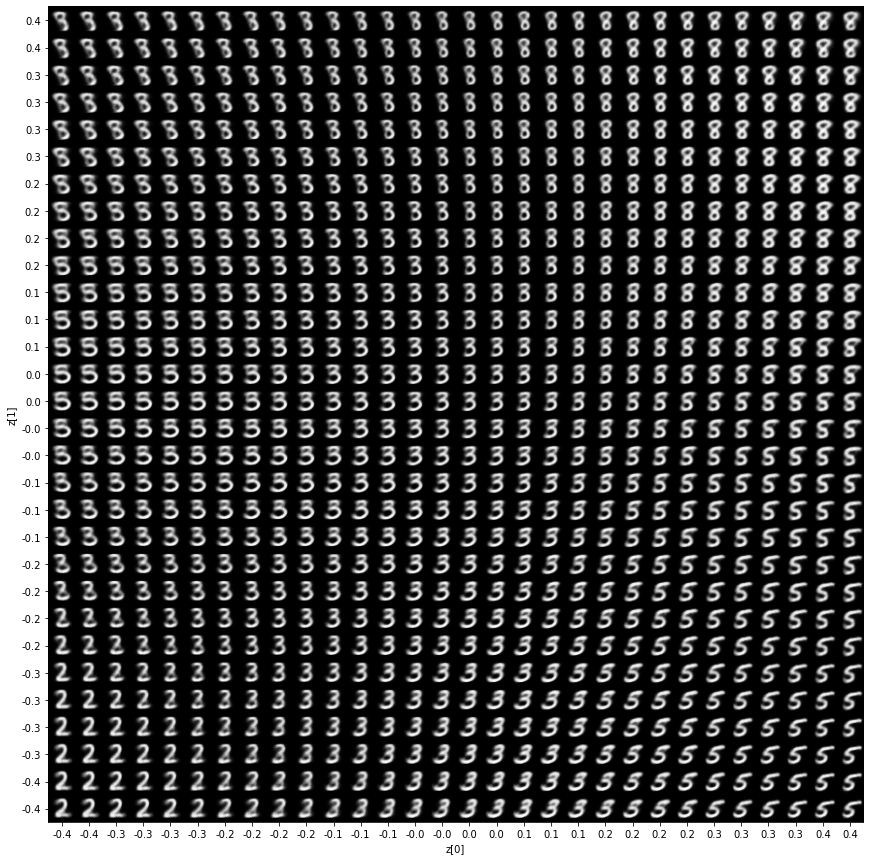

Scale value: 0.8


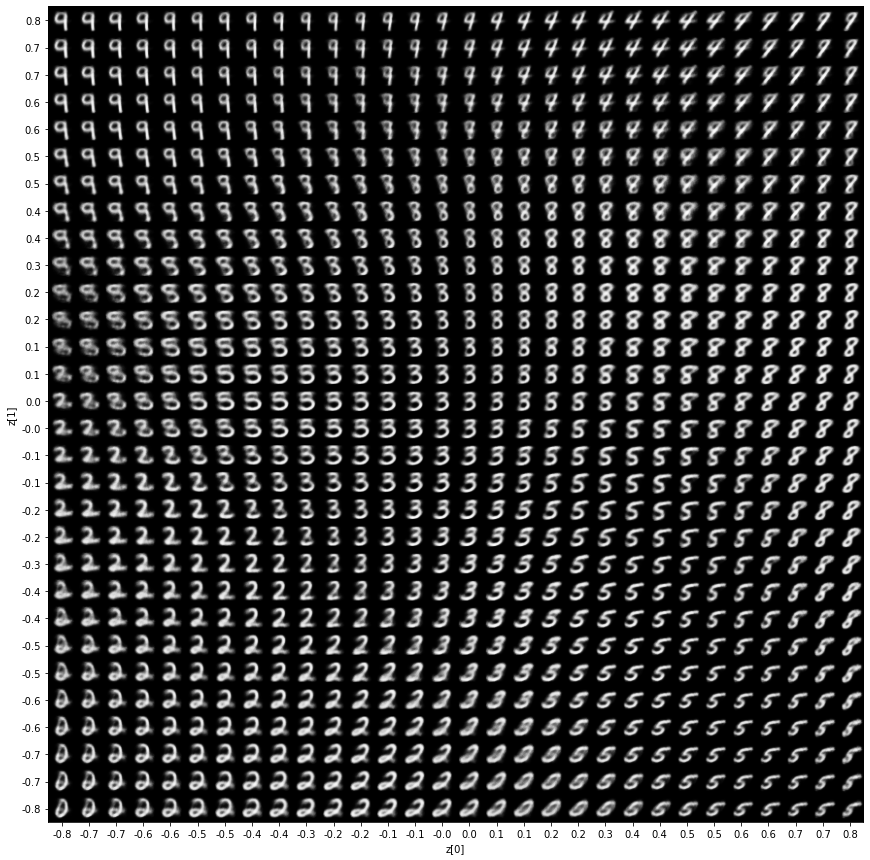

Scale value: 1.0


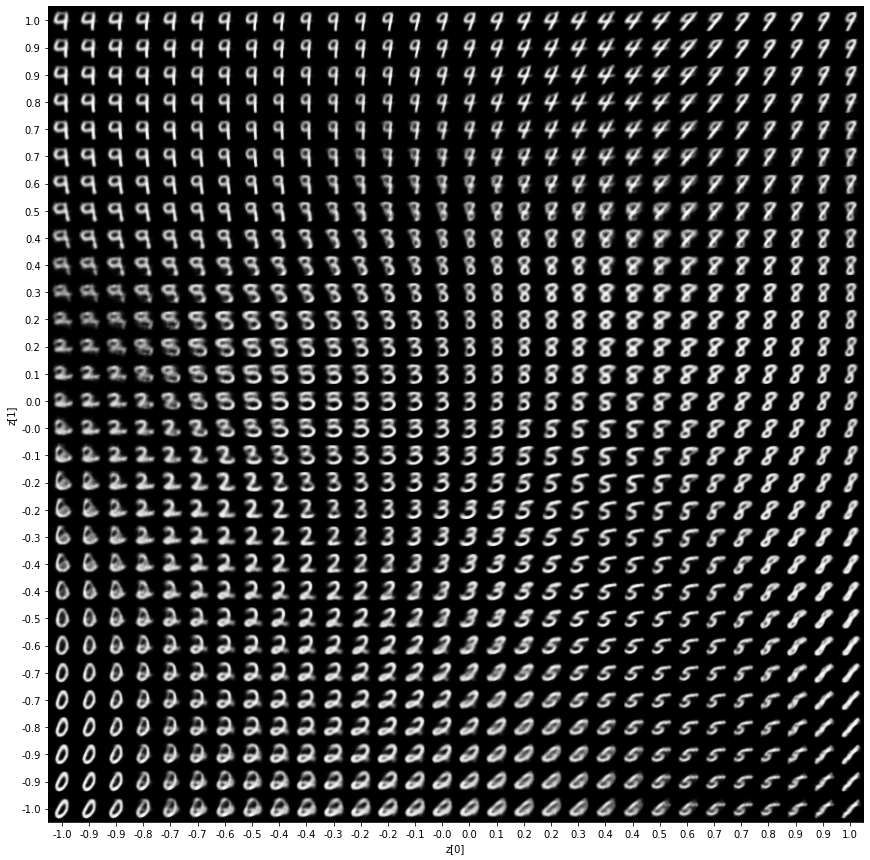

Scale value: 4.0


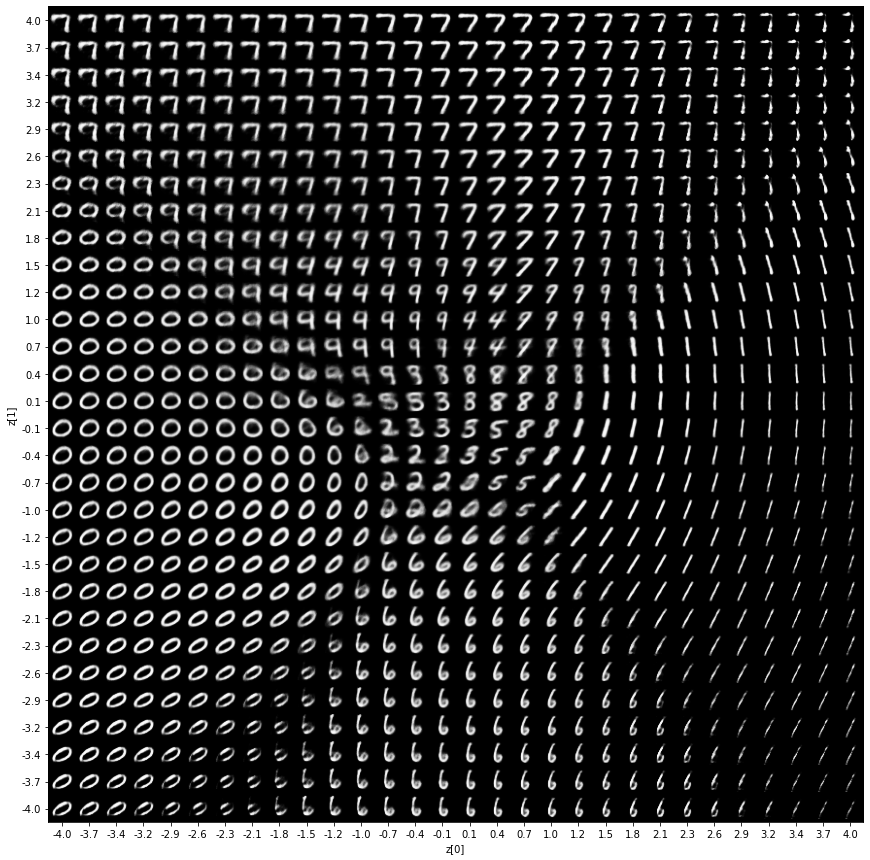

Scale value: 6.0


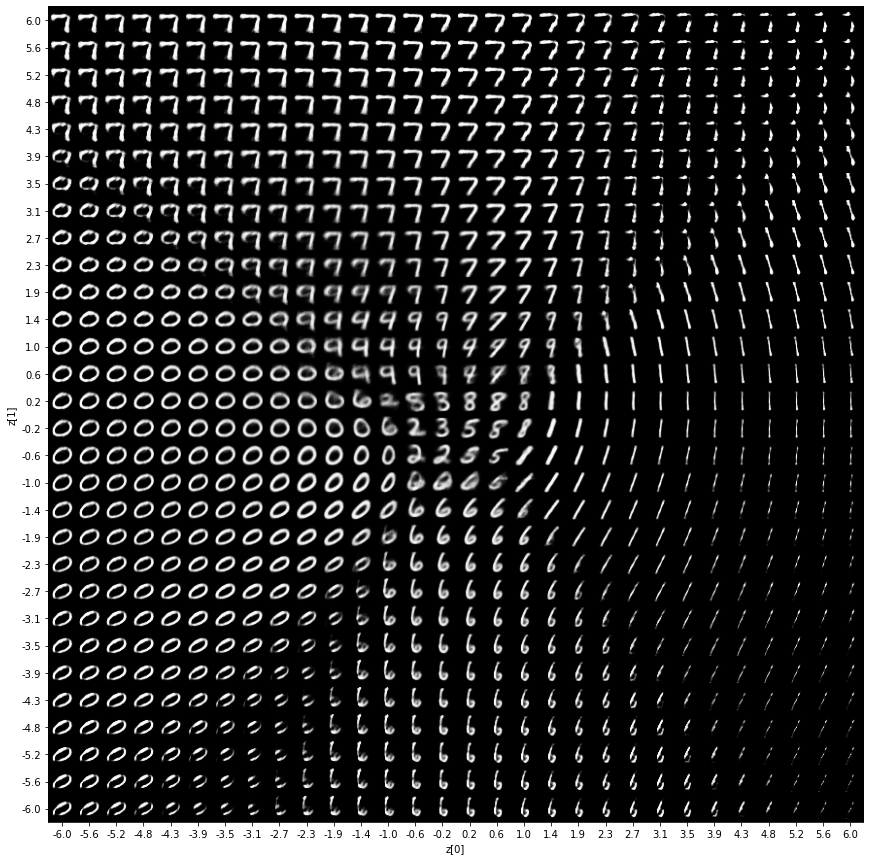

In [34]:
def plot_latent(encoder, decoder, scale=2.0, n = 30):
     
    digit_size = 28
    figsize = 15
    figure = np.zeros((digit_size * n, digit_size * n))

    grid_x = np.linspace(-scale, scale, n)
    grid_y = np.linspace(-scale, scale, n)[::-1]

    for i, yi in enumerate(grid_y):
        for j, xi in enumerate(grid_x):
            z_sample = np.array([[xi, yi]])
            x_decoded = decoder.predict(z_sample)
            digit = x_decoded[0].reshape(digit_size, digit_size)
            figure[
                i * digit_size : (i + 1) * digit_size,
                j * digit_size : (j + 1) * digit_size,
            ] = digit

    plt.figure(figsize=(figsize, figsize))
    start_range = digit_size // 2
    end_range = n * digit_size + start_range + 1
    pixel_range = np.arange(start_range, end_range, digit_size)
    sample_range_x = np.round(grid_x, 1)
    sample_range_y = np.round(grid_y, 1)
    plt.xticks(pixel_range, sample_range_x)
    plt.yticks(pixel_range, sample_range_y)
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.imshow(figure, cmap="Greys_r")
    plt.show()

print('Scale value: 2.0')
plot_latent(encoder, decoder, 2.0, 30) 

#[TO COMPLETE] explore what happens with different "scales"

scales = [0.2, 0.4, 0.8, 1.0, 4.0, 6.0]

for scale in scales:
  print('Scale value: {}'.format(str(scale)))
  plot_latent(encoder, decoder, scale, 30)

The final result is quite impressive, considering that all these digits are artificial and they not belong to any dataset!
Let's finally check how the various digits have been represented in the latent space by the VAE.

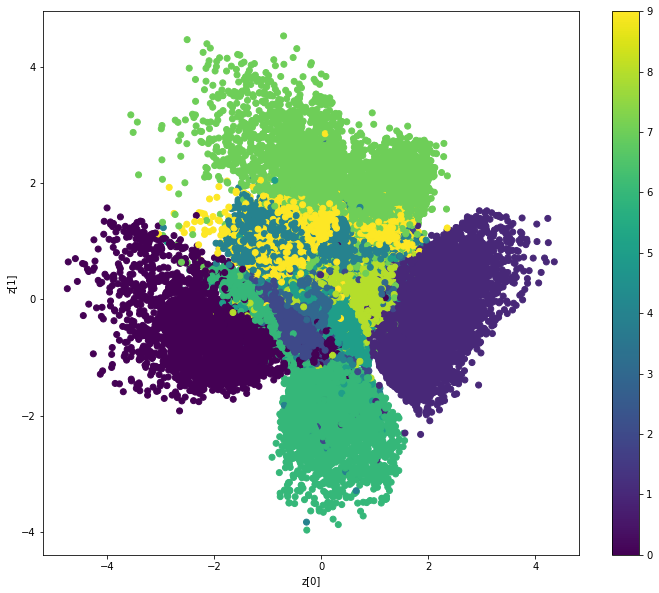

In [35]:
def plot_label_clusters(encoder, decoder, data, labels):
    z_mean, _, _ = encoder.predict(data)
    plt.figure(figsize=(12, 10))
    plt.scatter(z_mean[:, 0], z_mean[:, 1], c=labels)
    plt.colorbar()
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.show()

plot_label_clusters(encoder, decoder, x_train, y_train)

**[TO COMPLETE]** Discuss the obtained plots, and  explore how the hyper-parameters of the VAE (number of layers, layer sizes, etc.) influence the final result. Insert your discussion into cells immediately below this one.

## Increasing number of layers

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_20 (InputLayer)          [(None, 784)]        0           []                               
                                                                                                  
 dense_88 (Dense)               (None, 256)          200960      ['input_20[0][0]']               
                                                                                                  
 dense_89 (Dense)               (None, 128)          32896       ['dense_88[0][0]']               
                                                                                                  
 dense_90 (Dense)               (None, 64)           8256        ['dense_89[0][0]']               
                                                                                            

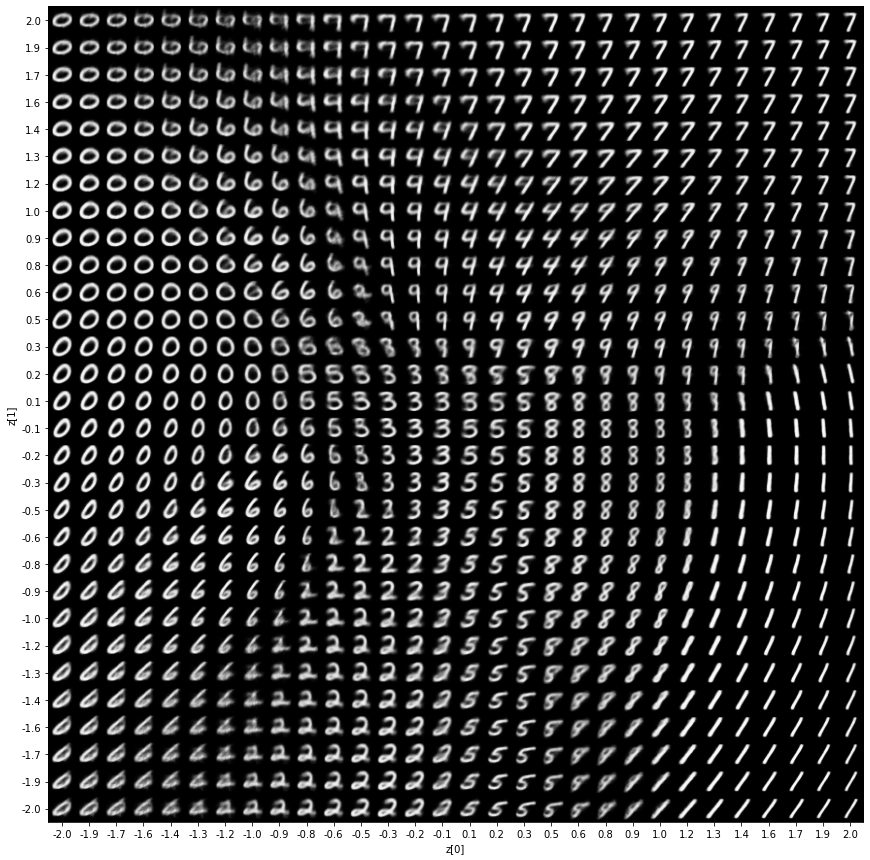

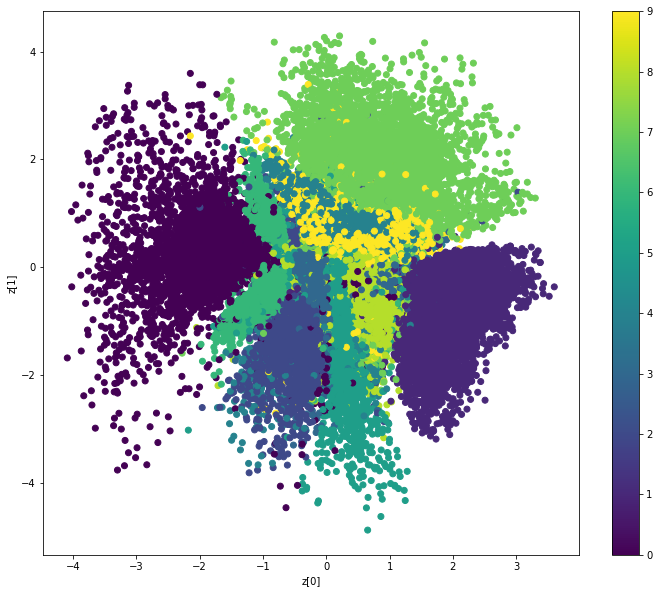

In [36]:
# Model No 1

latent_dim = 2
INPUT_DIM = x_train.shape[-1]

# Encoder
encoder_inputs = tf.keras.layers.Input(shape=(INPUT_DIM))
x = tf.keras.layers.Dense(256, activation='relu')(encoder_inputs)
x = tf.keras.layers.Dense(128, activation='relu')(x)
x = tf.keras.layers.Dense(64, activation='relu')(x)
x = tf.keras.layers.Dense(32, activation='relu')(x)

z_mean = tf.keras.layers.Dense(latent_dim)(x)
z_var = tf.keras.layers.Dense(latent_dim)(x)
z = Sampling()([z_mean, z_var])

encoder = tf.keras.Model(encoder_inputs, [z_mean, z_var, z], name="encoder")
encoder.summary()

# Decoder
latent_inputs = keras.Input(shape=(latent_dim,))
x = tf.keras.layers.Dense(32, activation='relu')(latent_inputs)
x = tf.keras.layers.Dense(64, activation='relu')(x)
x = tf.keras.layers.Dense(128, activation='relu')(x)
x = tf.keras.layers.Dense(256, activation='relu')(x)
decoder_outputs = tf.keras.layers.Dense(INPUT_DIM, activation='sigmoid')(x)

decoder = tf.keras.Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()

vae = VAE(encoder, decoder)
vae.compile(optimizer=keras.optimizers.Adam())
vae.fit(x_train, epochs=30, batch_size=128)

plot_latent(encoder, decoder, 2.0, 30) 
plot_label_clusters(encoder, decoder, x_train, y_train)

## Decreasing number of layers

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_22 (InputLayer)          [(None, 784)]        0           []                               
                                                                                                  
 dense_99 (Dense)               (None, 256)          200960      ['input_22[0][0]']               
                                                                                                  
 dense_100 (Dense)              (None, 128)          32896       ['dense_99[0][0]']               
                                                                                                  
 dense_101 (Dense)              (None, 2)            258         ['dense_100[0][0]']              
                                                                                            

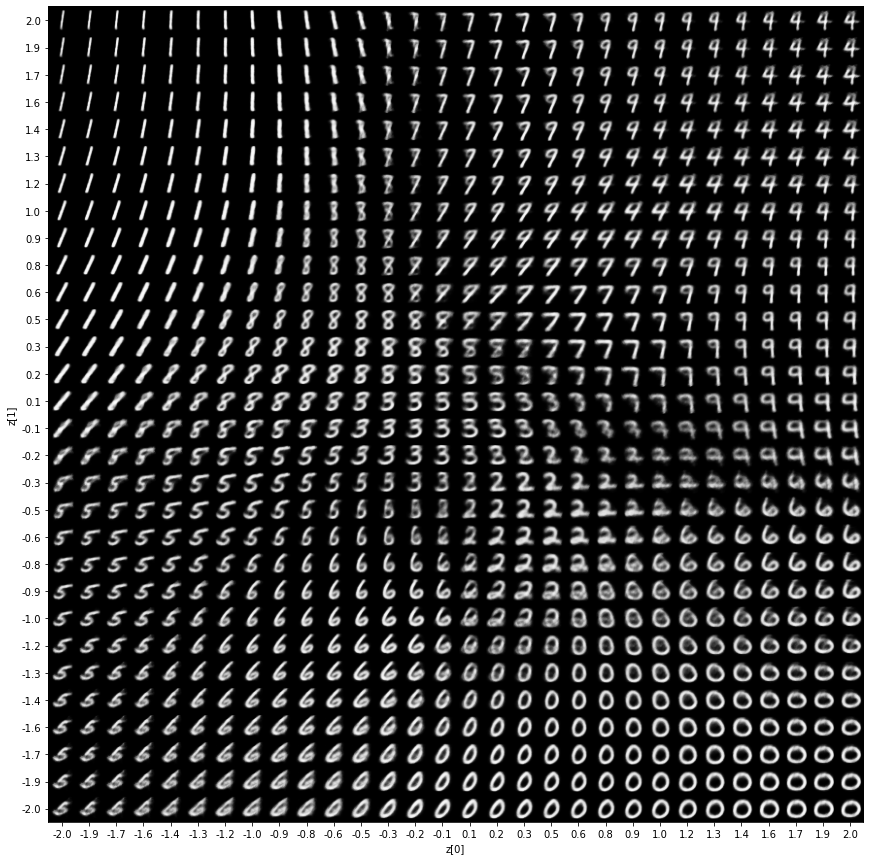

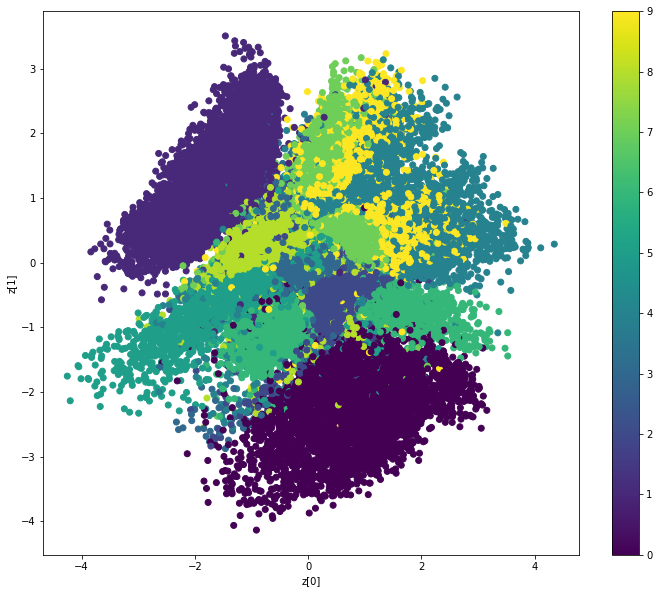

In [37]:
# Model No 2

latent_dim = 2
INPUT_DIM = x_train.shape[-1]

# Encoder
encoder_inputs = tf.keras.layers.Input(shape=(INPUT_DIM))
x = tf.keras.layers.Dense(256, activation='relu')(encoder_inputs)
x = tf.keras.layers.Dense(128, activation='relu')(x)

z_mean = tf.keras.layers.Dense(latent_dim)(x)
z_var = tf.keras.layers.Dense(latent_dim)(x)
z = Sampling()([z_mean, z_var])

encoder = tf.keras.Model(encoder_inputs, [z_mean, z_var, z], name="encoder")
encoder.summary()

# Decoder
latent_inputs = keras.Input(shape=(latent_dim,))
x = tf.keras.layers.Dense(128, activation='relu')(latent_inputs)
x = tf.keras.layers.Dense(256, activation='relu')(x)

decoder_outputs = tf.keras.layers.Dense(INPUT_DIM, activation='sigmoid')(x)

decoder = tf.keras.Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()

vae = VAE(encoder, decoder)
vae.compile(optimizer=keras.optimizers.Adam())
vae.fit(x_train, epochs=30, batch_size=128)

plot_latent(encoder, decoder, 2.0, 30) 
plot_label_clusters(encoder, decoder, x_train, y_train)

## Increasing layer sizes

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_24 (InputLayer)          [(None, 784)]        0           []                               
                                                                                                  
 dense_106 (Dense)              (None, 512)          401920      ['input_24[0][0]']               
                                                                                                  
 dense_107 (Dense)              (None, 256)          131328      ['dense_106[0][0]']              
                                                                                                  
 dense_108 (Dense)              (None, 128)          32896       ['dense_107[0][0]']              
                                                                                            

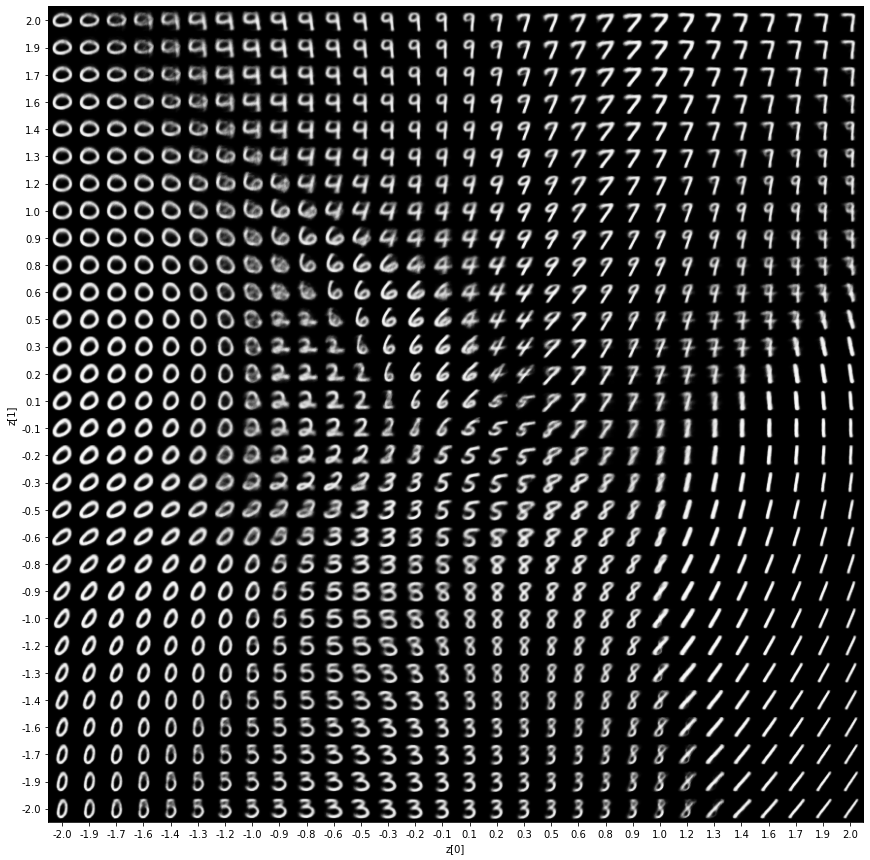

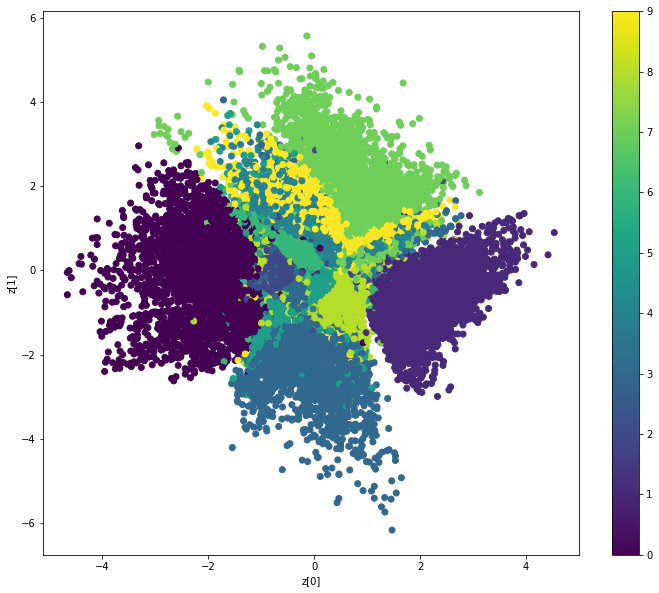

In [38]:
# Model No 3

latent_dim = 2
INPUT_DIM = x_train.shape[-1]

# Encoder
encoder_inputs = tf.keras.layers.Input(shape=(INPUT_DIM))
x = tf.keras.layers.Dense(512, activation='relu')(encoder_inputs)
x = tf.keras.layers.Dense(256, activation='relu')(x)
x = tf.keras.layers.Dense(128, activation='relu')(x)

z_mean = tf.keras.layers.Dense(latent_dim)(x)
z_var = tf.keras.layers.Dense(latent_dim)(x)
z = Sampling()([z_mean, z_var])

encoder = tf.keras.Model(encoder_inputs, [z_mean, z_var, z], name="encoder")
encoder.summary()

# Decoder
latent_inputs = keras.Input(shape=(latent_dim,))
x = tf.keras.layers.Dense(128, activation='relu')(latent_inputs)
x = tf.keras.layers.Dense(256, activation='relu')(x)
x = tf.keras.layers.Dense(512, activation='relu')(x)

decoder_outputs = tf.keras.layers.Dense(INPUT_DIM, activation='sigmoid')(x)

decoder = tf.keras.Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()

vae = VAE(encoder, decoder)
vae.compile(optimizer=keras.optimizers.Adam())
vae.fit(x_train, epochs=30, batch_size=128)

plot_latent(encoder, decoder, 2.0, 30) 
plot_label_clusters(encoder, decoder, x_train, y_train)

## Decreasing layer sizes

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_26 (InputLayer)          [(None, 784)]        0           []                               
                                                                                                  
 dense_115 (Dense)              (None, 128)          100480      ['input_26[0][0]']               
                                                                                                  
 dense_116 (Dense)              (None, 64)           8256        ['dense_115[0][0]']              
                                                                                                  
 dense_117 (Dense)              (None, 32)           2080        ['dense_116[0][0]']              
                                                                                            

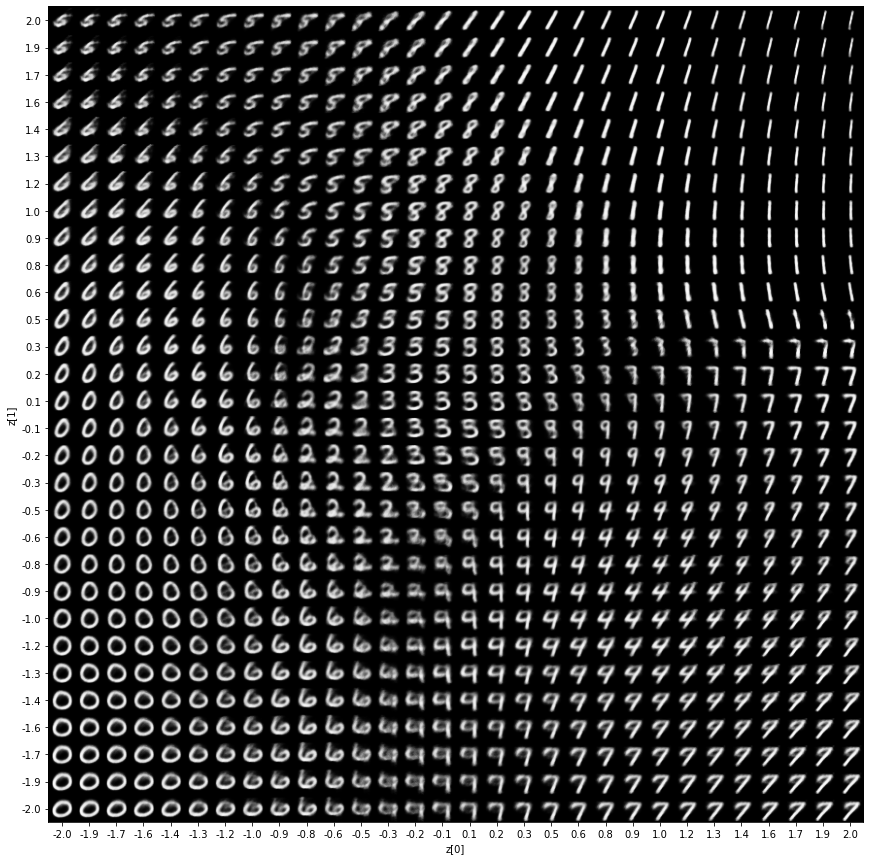

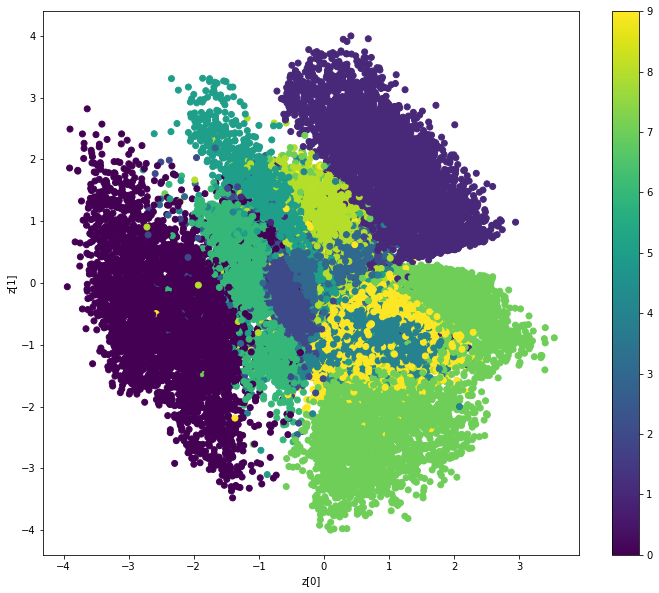

In [39]:
# Model No 4

latent_dim = 2
INPUT_DIM = x_train.shape[-1]

# Encoder
encoder_inputs = tf.keras.layers.Input(shape=(INPUT_DIM))
x = tf.keras.layers.Dense(128, activation='relu')(encoder_inputs)
x = tf.keras.layers.Dense(64, activation='relu')(x)
x = tf.keras.layers.Dense(32, activation='relu')(x)

z_mean = tf.keras.layers.Dense(latent_dim)(x)
z_var = tf.keras.layers.Dense(latent_dim)(x)
z = Sampling()([z_mean, z_var])

encoder = tf.keras.Model(encoder_inputs, [z_mean, z_var, z], name="encoder")
encoder.summary()

# Decoder
latent_inputs = keras.Input(shape=(latent_dim,))
x = tf.keras.layers.Dense(32, activation='relu')(latent_inputs)
x = tf.keras.layers.Dense(64, activation='relu')(x)
x = tf.keras.layers.Dense(128, activation='relu')(x)

decoder_outputs = tf.keras.layers.Dense(INPUT_DIM, activation='sigmoid')(x)

decoder = tf.keras.Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()

vae = VAE(encoder, decoder)
vae.compile(optimizer=keras.optimizers.Adam())
vae.fit(x_train, epochs=30, batch_size=128)

plot_latent(encoder, decoder, 2.0, 30) 
plot_label_clusters(encoder, decoder, x_train, y_train)

**Answer:** [TO COMPLETE}

**Effect of Scale value**

I tried different scale values, generated and plotted the data based on them. I observed that smaller values cause worse represantation and It is harder to distinguish the output. The variety of the generated data in case of a small scale value is less (3, 8 or 5 in my example). On the contrary, as scale value increases, the digits differentiate more and becomes clearer. The variety and the sharpness of the digits increase, however, the transaction areas are fuzzier with the bigger scale values. And with even bigger scale values, the sharpness increase so much that the variety decrases again. So, depending on the observations, a scale value of 2.0 is the best trade-off.


**Number of layers**

When the # of layers increased, total loss slightly decreased (from 139.38 to 138.53) but there was not a significant change in the plot and the generated data. When less layers were used, The total error increased a little and more overlapping of the cluster points was observed in the plot. Therefore, 2 layers was outperformed by 3. But 4 layers does not have a significant benefit, considering that it increases the model complexity and causes a computational burden. This supports my choice of using 3 layers.

**Layer sizes - number of units**

With more units, there was not a significant change in the total loss and in the clarity/quality of the outputs (solely a slight decrease). However, the cluster boundaries in the latent space has been improved. In other words, there was less overlap and more distinc boundaries. 
With less units, the model became worse in terms of loss and the clarity of the outputs. In addition, the distribution of the plots has changed a lot, seemed to be more sparse and to have more overlaps. So I concluded that up to a point, number of units has more effect than the number of layers. This selection should be made depending on the input data in hand.

**Interpretation of plots and generated data**

When I look at the transitions in the generated examples and the graphs, I noticed that with more overlapping regions in the graph, the clarity of the outputs was affected badly. Also, when the clarity gets worse, the distribution of the points becomes more sparse and less even.


**Activation function**

I have already mentioned the reasons of using Relu as an activation function. In addition to all of them, it needs less computational effort than other non-linear activation functions such as tanh and sigmoid, because calculating its derivative is easier compared to calculating the derivative of the exponents. It's a function that copes with the vanishing gradient problem, because the gradient is always a constant, either 1 or 0. If the value is 1, the gradient is back propagated as it is. If it is 0, then no gradient is backpropagated.
